<a href="https://colab.research.google.com/github/Sahar-Sheikhi/Computer-Vision/blob/main/Project%2003%20(Local%20Visual%20Features)/Lab3_SIFT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **SIFT Algorithm**

SIFT (Scale Invariant Feature Transform) is a widely used feature detection algorithm in computer vision.

The algorithm can be divided into several steps:

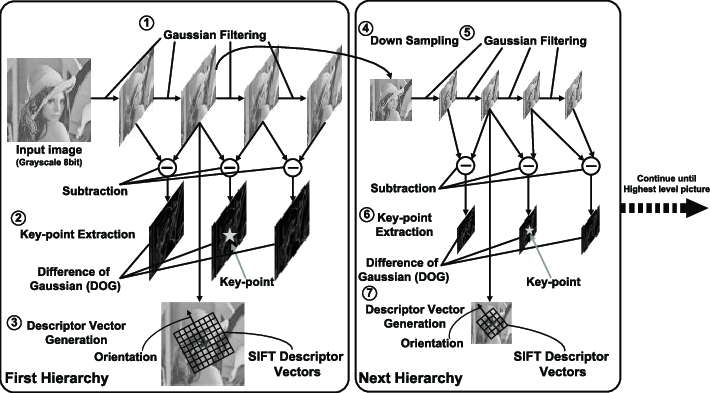

"A Low-Power Real-Time SIFT Descriptor Generation Engine for Full-HDTV Video Recognition", Mizuno et al., IEICE Transactions on Electronics, 2011.

Another popular feature matching algorithm is SURF (Speeded Up Robust Feature), which is simply a faster version of SIFT.


We will use the OpenCV implementation of the SIFT algorithm to detect keypoints and descriptors of an image.

In [1]:
# Update OpenCV package
!pip install -U opencv-python

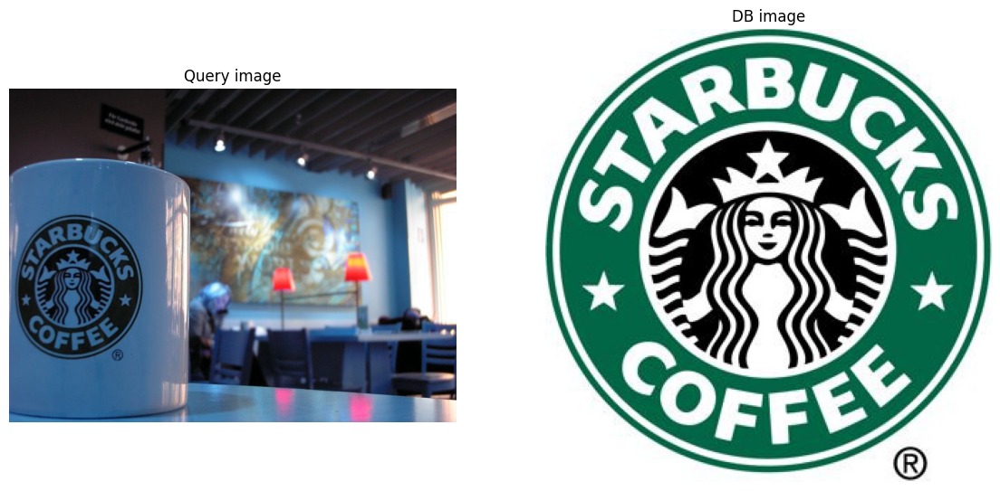

In [2]:
# Import libraries
import cv2
import matplotlib.pyplot as plt
import numpy as np
import sklearn.metrics

# Read images
db_image = cv2.imread("db.jpg")
db_image = cv2.cvtColor(db_image, cv2.COLOR_BGR2RGB)
query_image = cv2.imread("query.jpg")
query_image_orig = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)

# Display images
fig = plt.figure(figsize=(14, 12))
plt.subplot(1,2,1), plt.imshow(query_image), plt.title("Query image"), plt.axis("off")
plt.subplot(1,2,2), plt.imshow(db_image), plt.title("DB image"), plt.axis("off")
plt.show()

In [3]:
# Define SIFT detector
# SIFT_create([, nfeatures[, nOctaveLayers[, contrastThreshold[, edgeThreshold[, sigma]]]]]) -> retval
sift = cv2.SIFT_create()

# Detects keypoints and computes the descriptors
# keypoints, descriptors	=	cv2.Feature2D.detectAndCompute(	image, mask[, descriptors[, useProvidedKeypoints]]	)
keypoints_q, descriptors_q = sift.detectAndCompute(query_image, None)
# Print number of keypoints
print(f"Number of detected keypoints/descriptors (Query image): {len(keypoints_q)}")
keypoints_db, descriptors_db = sift.detectAndCompute(db_image, None)
# Print number of keypoints
print(f"Number of detected keypoints/descriptors (Database image): {len(keypoints_db)}")

Number of detected keypoints/descriptors (Query image): 993
Number of detected keypoints/descriptors (Database image): 565


In [4]:
# Select 1st keypoint and show (some of) its attributes
kpt = keypoints_q[0]
des = descriptors_q[0]
print(f"\n1st Keypoint Attributes\n")
print(f"Class: {type(kpt)}")
print(f"Angle (computed orientation of the keypoint): {kpt.angle}")
print(f"Pt (coordinates of the keypoint): {kpt.pt}")
print(f"Response ('strength' of the keypoint): {kpt.response}")
print(f"Size (diameter of the meaningful keypoint neighborhood): {kpt.size}")
print(f"Descriptor Length: {des.size}:\n")
print(f"Descriptor: \n{des}")


1st Keypoint Attributes

Class: <class 'cv2.KeyPoint'>
Angle (computed orientation of the keypoint): 174.51986694335938
Pt (coordinates of the keypoint): (3.2741360664367676, 209.7332000732422)
Response ('strength' of the keypoint): 0.015237448737025261
Size (diameter of the meaningful keypoint neighborhood): 2.579479455947876
Descriptor Length: 128:

Descriptor: 
[117.  14.   2.   0.   0.   0.   0.   9.  21.  14.  13.   7.   4.   7.
  22.  42.   0.   0.   0.   4.  31.  74.  31.  13.   0.   0.   0.   0.
   5.   7.   0.   0. 104.  24.   3.   0.   0.   0.   0.  18. 139.  36.
   8.   6.   7.  29.  62. 139.  28.   9.   8.  42. 125. 139.  84.  58.
   0.   0.   0.   2.  13.  23.   0.   0.  70.  73.   2.   0.   0.   0.
   0.   1. 139. 139. 132.  37.   5.   3.   2.  16.  21.  44. 139. 139.
  73.  24.   2.   6.   0.   0.   6.  13.   6.   3.   0.   0.  39.  49.
   3.   0.   0.   0.   0.   0.   5.  41.  60.  27.   3.   1.   1.   0.
   0.   3.  59.  57.   9.   4.   1.   0.   0.   0.   2.   2.   0

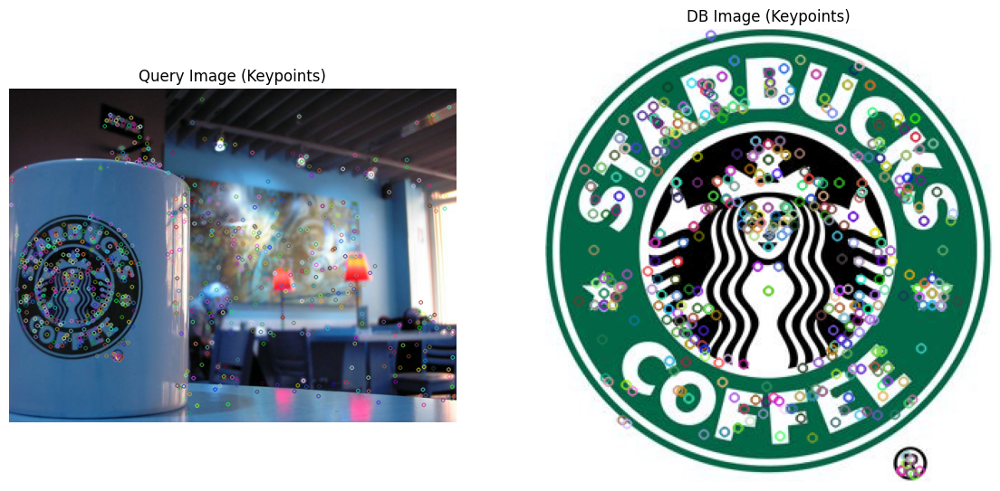

In [5]:
# Copy images
q_img = query_image.copy()
db_img = db_image.copy()

# Draw keypoints of the original image
# outImage	=	cv2.drawKeypoints(	image, keypoints, outImage[, color[, flags]]	)
# DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG flag ensures that the keypoints are drawn on the output image without overwriting the original image
cv2.drawKeypoints(q_img, keypoints_q, q_img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG)
                                        #cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
cv2.drawKeypoints(db_img, keypoints_db, db_img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG)
# Display image with keypoints
plt.figure(figsize=(14, 8)),
plt.subplot(1,2,1), plt.imshow(q_img), plt.title("Query Image (Keypoints)"), plt.axis("off")
plt.subplot(1,2,2), plt.imshow(db_img), plt.title("DB Image (Keypoints)"),  plt.axis("off")
plt.show()

## **Feature Matching**

Feature matching is a computer vision technique for establishing correspondences between two images containing the same (or similar) elements. The general idea is to match keypoints (and descriptors) of a query image to the most similar keypoints (and descriptors) of a database image. They can be obtained using Brute-Force or k-NN matchers.


**Brute-Force (BF) Matcher**

*BF Matcher* detects for each descriptor of the query image the closest descriptor (using Euclidean distance or another distance measure) of the database image. In other words, for each descriptor of the query image, it computes the distance between this descriptor and all the descriptors detected in the database image. Then, the closest database descriptors is selected and associated to the query descriptor. Once all the correspondences have been found, matches whose distances are greater than a fixed threshold are removed to only consider "robust" matches.

Note that this matching procedure can be very slow if the number of detected features is high.

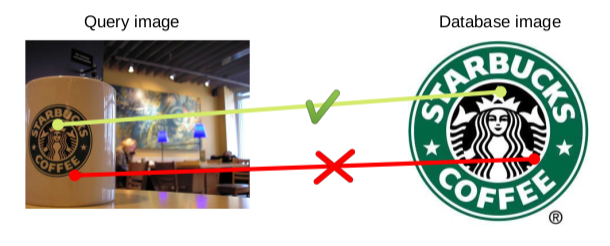

# **Ex. 1 - Brute-force Matching**

Implement the brute-force matching procedure between a query and a database image.


*   Firstly, extract keypoints and descriptors for both the query and database images.
*   Print the number of detected keypoints of both query and database images.
*   Create a distance matrix "dist_matrix" and compute the Euclidean distance between each query descriptors and all the database descriptors. The rows should correspond to the query descriptors while the columns to the database descriptors.
*   For each query descriptor, find the closest database descriptor.
*   Select a threshold value (e.g., 80) and retain only the correspondeces below that threshold.
*   Print the indices of the retrieved matches (query descriptor index, database descriptor index and corresponding Euclidean distance).

In [6]:
# Detect and compute keypoints and descriptors
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
db_keypoints, db_descriptors = sift.detectAndCompute(db_image, None)
print(f"\nNumber of keypoints (query image): {len(query_keypoints)}.")
print(f"Number of keypoints (database image): {len(db_keypoints)}.\n")


Number of keypoints (query image): 993.
Number of keypoints (database image): 565.



In [7]:
# Distance matrix (rows correspond to query descriptors while columns to database descriptors)

# dist_matrix = np.zeros((len(query_descriptors), len(db_descriptors)))
# for i, desQ in enumerate(query_descriptors):
#   for j, desB in enumerate(db_descriptors):
#     dist_matrix[i, j] = np.linalg.norm(desQ - desB)

# Efficient code
dist_matrix = sklearn.metrics.pairwise_distances(query_descriptors, db_descriptors)

In [8]:
# Find the closest database descriptor for each query descriptor
# and the corresponding distance
min_distances = dist_matrix.min(axis=1)
db_descriptors_idx = np.argmin(dist_matrix, axis=1)

In [9]:
# Discard matches above the threshold
thrs = 80
query_descriptors_idx = np.where(min_distances <= thrs)[0]

In [10]:
# Select keypoints, descriptors, and indices of retrieved matches

# Query kps and des
query_keypoints = [query_keypoints[idx] for idx in query_descriptors_idx]
query_descriptors = [query_descriptors[idx] for idx in query_descriptors_idx]

# DB kps and des
db_descriptors_idx = [db_descriptors_idx[idx] for idx in query_descriptors_idx]
db_keypoints = [db_keypoints[idx] for idx in db_descriptors_idx]
db_descriptors = [db_descriptors[idx] for idx in db_descriptors_idx]

min_distances = [min_distances[idx] for idx in query_descriptors_idx]
print(f'Number of matches: {len(min_distances)}')

# Print Euclidean distance, query descriptor index and database descriptor index of retrieved matches
for k in range(len(min_distances)):
  print(f'Query Descriptor n.{query_descriptors_idx[k]},Database Descriptor n.{db_descriptors_idx[k]}, Euclidean distance: {min_distances[k]: .2f}')

Number of matches: 49
Query Descriptor n.147,Database Descriptor n.176, Euclidean distance:  61.11
Query Descriptor n.152,Database Descriptor n.190, Euclidean distance:  72.28
Query Descriptor n.166,Database Descriptor n.206, Euclidean distance:  67.28
Query Descriptor n.184,Database Descriptor n.212, Euclidean distance:  59.95
Query Descriptor n.194,Database Descriptor n.237, Euclidean distance:  70.36
Query Descriptor n.203,Database Descriptor n.253, Euclidean distance:  60.58
Query Descriptor n.218,Database Descriptor n.256, Euclidean distance:  54.78
Query Descriptor n.224,Database Descriptor n.271, Euclidean distance:  79.33
Query Descriptor n.256,Database Descriptor n.310, Euclidean distance:  50.48
Query Descriptor n.257,Database Descriptor n.311, Euclidean distance:  76.22
Query Descriptor n.265,Database Descriptor n.318, Euclidean distance:  69.91
Query Descriptor n.266,Database Descriptor n.321, Euclidean distance:  75.38
Query Descriptor n.309,Database Descriptor n.363, Eucl

We can now visualize the positions of the matched kepypoints in both images.

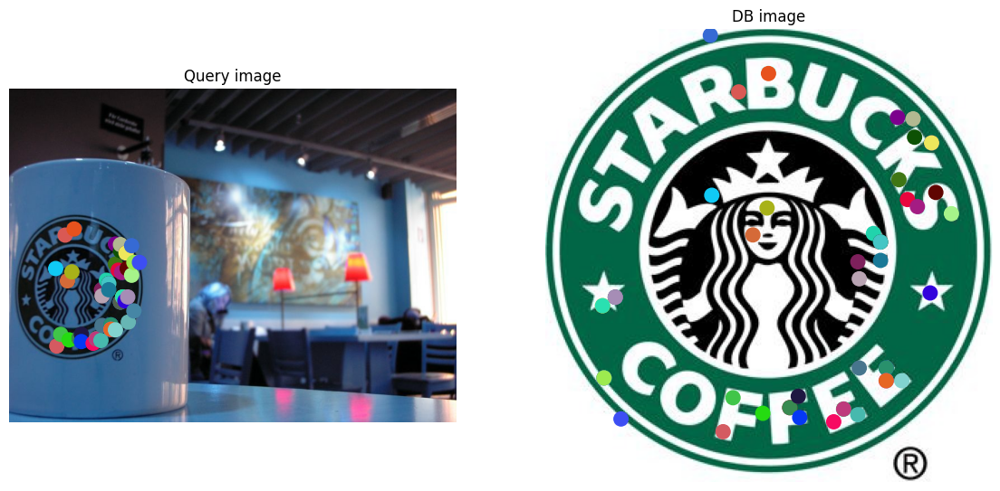

In [11]:
# 2-D keypoints coordinates
#points2f	=	cv.KeyPoint_convert(	keypoints[, keypointIndexes]	)
# This method converts vector of keypoints to vector of points or the reverse
points2f_query	=	cv2.KeyPoint_convert(query_keypoints).astype(int)
points2f_db	=	cv2.KeyPoint_convert(db_keypoints).astype(int)

# Random color
c = np.random.rand(len(points2f_query), 3)

plt.figure(figsize=(14, 10))
plt.subplot(1, 2, 1), plt.imshow(query_image), plt.axis("off"), plt.title('Query image')
plt.scatter(points2f_query[:, 0], points2f_query[:, 1], s = 125, color = c, marker='o')
plt.subplot(1, 2, 2), plt.imshow(db_image), plt.axis("off"), plt.title('DB image')
plt.scatter(points2f_db[:, 0], points2f_db[:, 1], s = 125, color = c, marker='o')

plt.show()

*   Let's use a smaller threshold (e.g., 60)






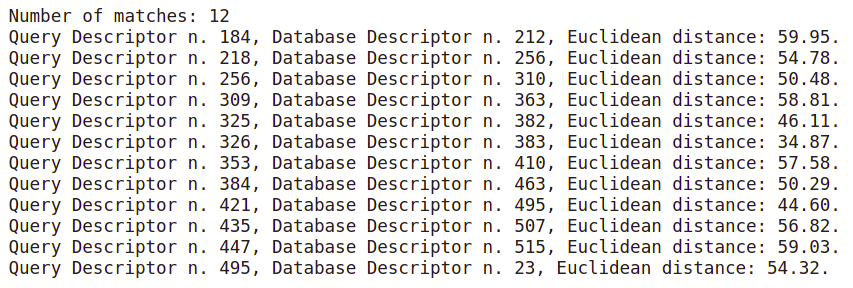

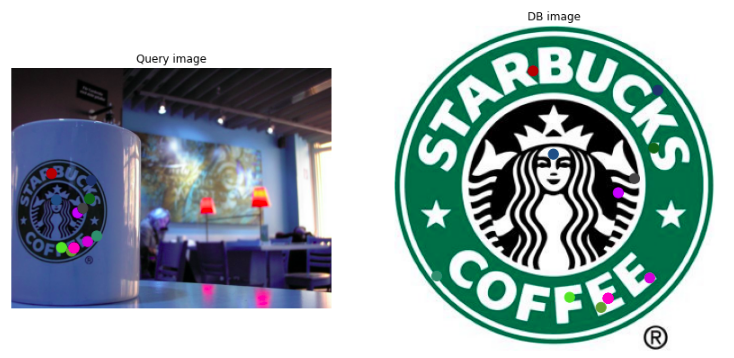

*   OpenCV provides a method, "BFMatcher_create()", that implements the Brute-Force matcher.

In [12]:
# Detect and compute keypoints and descriptors
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
db_keypoints, db_descriptors = sift.detectAndCompute(db_image, None)

# Brute-force matcher create method.
# retval	=	cv.BFMatcher_create([, normType[, crossCheck]])
bf = cv2.BFMatcher_create(cv2.NORM_L2)

# Finds the best match for each descriptor from a query set.
# matches	=	cv.DescriptorMatcher.match(	queryDescriptors, trainDescriptors[, mask]	)
# It returns a list of DMatch objects with the following attributes:
# DMatch.distance - Distance between descriptors. The lower, the better it is.
# DMatch.trainIdx - Index of the descriptor in train descriptors
# DMatch.queryIdx - Index of the descriptor in query descriptors
# DMatch.imgIdx - Index of the train image.
matches = bf.match(query_descriptors, db_descriptors)

print('DMatch object attributes (matches[0]):')
print(f'DMatch.distance: {matches[0].distance}')
print(f'DMatch.queryIdx: {matches[0].queryIdx}')
print(f'DMatch.trainIdx: {matches[0].trainIdx}')
print(f'DMatch.imgIdx: {matches[0].imgIdx}')

DMatch object attributes (matches[0]):
DMatch.distance: 418.0896911621094
DMatch.queryIdx: 0
DMatch.trainIdx: 537
DMatch.imgIdx: 0


In [13]:
# Discard matches above the threshold
thrs = 60
min_distances = np.asarray([matches[idx].distance for idx in range(len(matches))])
min_query_descriptors_idx = np.where(min_distances <= thrs)[0]
min_db_descriptors_idx = np.asarray([matches[idx].trainIdx for idx in min_query_descriptors_idx])

In [14]:
print(f"\nNumber of matches: {len(min_query_descriptors_idx)}")
# Print Euclidean distance, query descriptor index and database descriptor index of retrieved matches
for idx in range(len(min_query_descriptors_idx)):
  query_idx = min_query_descriptors_idx[idx]
  print(f"Euclidean distance: {min_distances[query_idx]:.2f}, Query Descriptor: n. {query_idx}, Database Descriptor: n.{min_db_descriptors_idx[idx]}")


Number of matches: 12
Euclidean distance: 59.95, Query Descriptor: n. 184, Database Descriptor: n.212
Euclidean distance: 54.78, Query Descriptor: n. 218, Database Descriptor: n.256
Euclidean distance: 50.48, Query Descriptor: n. 256, Database Descriptor: n.310
Euclidean distance: 58.81, Query Descriptor: n. 309, Database Descriptor: n.363
Euclidean distance: 46.11, Query Descriptor: n. 325, Database Descriptor: n.382
Euclidean distance: 34.87, Query Descriptor: n. 326, Database Descriptor: n.383
Euclidean distance: 57.58, Query Descriptor: n. 353, Database Descriptor: n.410
Euclidean distance: 50.29, Query Descriptor: n. 384, Database Descriptor: n.463
Euclidean distance: 44.60, Query Descriptor: n. 421, Database Descriptor: n.495
Euclidean distance: 56.82, Query Descriptor: n. 435, Database Descriptor: n.507
Euclidean distance: 59.03, Query Descriptor: n. 447, Database Descriptor: n.515
Euclidean distance: 54.32, Query Descriptor: n. 495, Database Descriptor: n.23


*  Compare the above results with the output of the previous exercise.

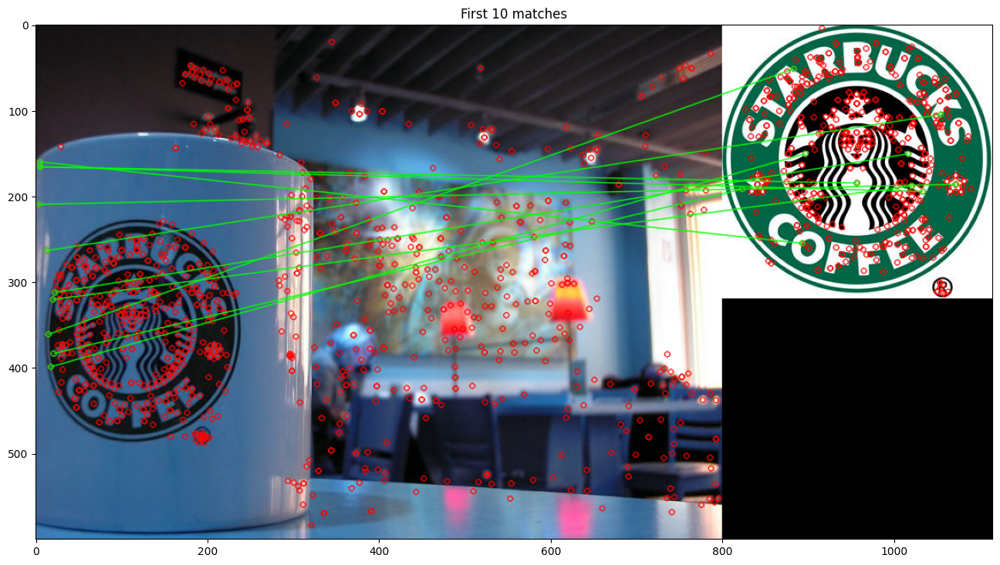

In [15]:
# Plot the first 10 matches
# outImg	=	cv.drawMatches(img1, keypoints1, img2, keypoints2, matches1to2, outImg[, matchColor[, singlePointColor[, matchesMask[, flags]]]]	)
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, matches[:10], None, **draw_params)

plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('First 10 matches')
plt.show()

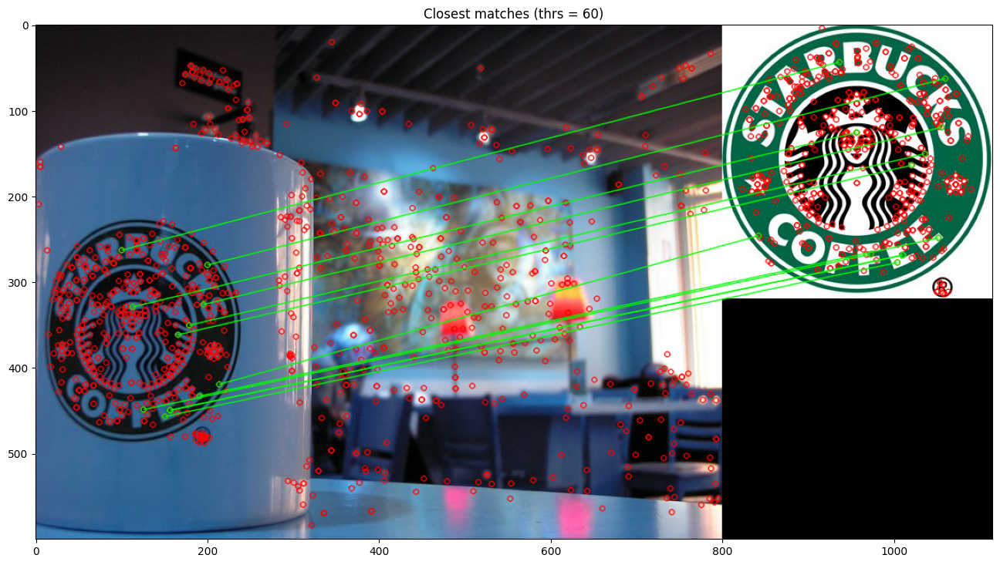

In [16]:
# Plot the closest matches (distance <= thrs)
# outImg	=	cv.drawMatches(img1, keypoints1, img2, keypoints2, matches1to2, outImg[, matchColor[, singlePointColor[, matchesMask[, flags]]]]	)
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
closest_matches = [matches[idx] for idx in min_query_descriptors_idx]
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, closest_matches, None, **draw_params)

plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title(f'Closest matches (thrs = {thrs})')
plt.show()

# **Ex. 2 - Ratio test**

> In this exercise, you will implement a K-NN matcher to get the K best matches (rather than the closest one). We set K=2 in order to apply the ratio test as reported by D. Lowe [[Ref]](https://https://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf).

Consider the following steps:

*   Apply the SIFT algorithm to detect keypoints and descriptors of query and database images.
*   For each query descriptor ($des_{q_i}$), you need to find the 2 closest database descriptors ($des_{db_j}$ and $des_{db_k}$).
*   Then, apply the ratio test to check if there is a match between $des_{q_i}$ and $des_{db_j}$. The ratio test is defined as follows:

\begin{equation}
\frac{dist(i,j)}{dist(i,k)} \lt 0.70
\end{equation}

where $dist(i,j) = ||(des_{q_i}-des_{db_j})||_2$ and $dist(i,k) = ||(des_{q_i}-des_{db_k})||_2$.

 If the above condition is satisfied, $des_{q_i}$ is matched to $des_{db_j}$. If the above condition is not satisfied, $des_{q_i}$ cannot be matched to any database descriptors.

* Print the Euclidean distance, query and database descriptors indices of the first 10 retrieved matches.

In [17]:
# Detect and compute keypoints and descriptors
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
db_keypoints, db_descriptors = sift.detectAndCompute(db_image, None)

# Pairwise distances
dist_matrix = sklearn.metrics.pairwise_distances(query_descriptors, db_descriptors)

## K-NN matcher (K=2)
# For each query descriptor find the indices and distances
# of the 2 closest database descriptors.
k = 2
distances = np.partition(dist_matrix, kth=k, axis=1)[:, :k]
db_idx = np.argpartition(dist_matrix, kth=k, axis=1)[:, :k]

# Apply ratio test
min_dist = []
min_query_idx = []
min_db_idx = []
for q in range(distances.shape[0]):
  if distances[q][0] < 0.7 * distances[q][1]:
    min_dist.append(distances[q][0])
    min_query_idx.append(q)
    min_db_idx.append(db_idx[q][0])


In [18]:
# Print some infos
print(f"Number of query keypoints:{len(query_keypoints)}")
print(f"Number of database keypoints:{len(db_keypoints)}")
print(f"Number of matches: {len(min_dist)}")

Number of query keypoints:993
Number of database keypoints:565
Number of matches: 184


In [19]:
# Print first 10 matches
nMatches = 10
for m in range(nMatches):
  print(f"Euclidean distance: {min_dist[m]:.2f}, Query Descriptor: n. {min_query_idx[m]}, Database Descriptor: n.{min_db_idx[m]}")

Euclidean distance: 182.81, Query Descriptor: n. 17, Database Descriptor: n.4
Euclidean distance: 191.49, Query Descriptor: n. 33, Database Descriptor: n.12
Euclidean distance: 146.39, Query Descriptor: n. 41, Database Descriptor: n.31
Euclidean distance: 227.60, Query Descriptor: n. 42, Database Descriptor: n.32
Euclidean distance: 199.33, Query Descriptor: n. 43, Database Descriptor: n.36
Euclidean distance: 183.65, Query Descriptor: n. 44, Database Descriptor: n.41
Euclidean distance: 175.87, Query Descriptor: n. 45, Database Descriptor: n.42
Euclidean distance: 173.50, Query Descriptor: n. 47, Database Descriptor: n.48
Euclidean distance: 203.00, Query Descriptor: n. 49, Database Descriptor: n.509
Euclidean distance: 187.89, Query Descriptor: n. 54, Database Descriptor: n.58


> OpenCV provides the knnMatch() function which implements the k-NN matcher.

In [20]:
# Create BFMatcher
bf = cv2.BFMatcher_create(cv2.NORM_L2)

# Apply k-NN match
# Finds the k best matches for each descriptor from a query set.
# matches	=	cv.DescriptorMatcher.knnMatch(	queryDescriptors, trainDescriptors, k[, mask[, compactResult]]	)
matches = bf.knnMatch(query_descriptors, db_descriptors, k=2) #  num_query_descriptors -> [2]

# Apply ratio test
matched_des = []
for m_ij, m_ik in matches:
    if m_ij.distance < 0.70 * m_ik.distance:
        matched_des.append(m_ij)

In [21]:
print(f"Number of matches: {len(matched_des)}")

Number of matches: 184


In [22]:
nMatches = 10
for k in range(nMatches):
  print(f"Euclidean distance: {matched_des[k].distance:.2f}, Query Descriptor: n. {matched_des[k].queryIdx}, Database Descriptor: n.{matched_des[k].trainIdx}")

Euclidean distance: 182.81, Query Descriptor: n. 17, Database Descriptor: n.4
Euclidean distance: 191.49, Query Descriptor: n. 33, Database Descriptor: n.12
Euclidean distance: 146.39, Query Descriptor: n. 41, Database Descriptor: n.31
Euclidean distance: 227.60, Query Descriptor: n. 42, Database Descriptor: n.32
Euclidean distance: 199.33, Query Descriptor: n. 43, Database Descriptor: n.36
Euclidean distance: 183.65, Query Descriptor: n. 44, Database Descriptor: n.41
Euclidean distance: 175.87, Query Descriptor: n. 45, Database Descriptor: n.42
Euclidean distance: 173.50, Query Descriptor: n. 47, Database Descriptor: n.48
Euclidean distance: 203.00, Query Descriptor: n. 49, Database Descriptor: n.509
Euclidean distance: 187.89, Query Descriptor: n. 54, Database Descriptor: n.58


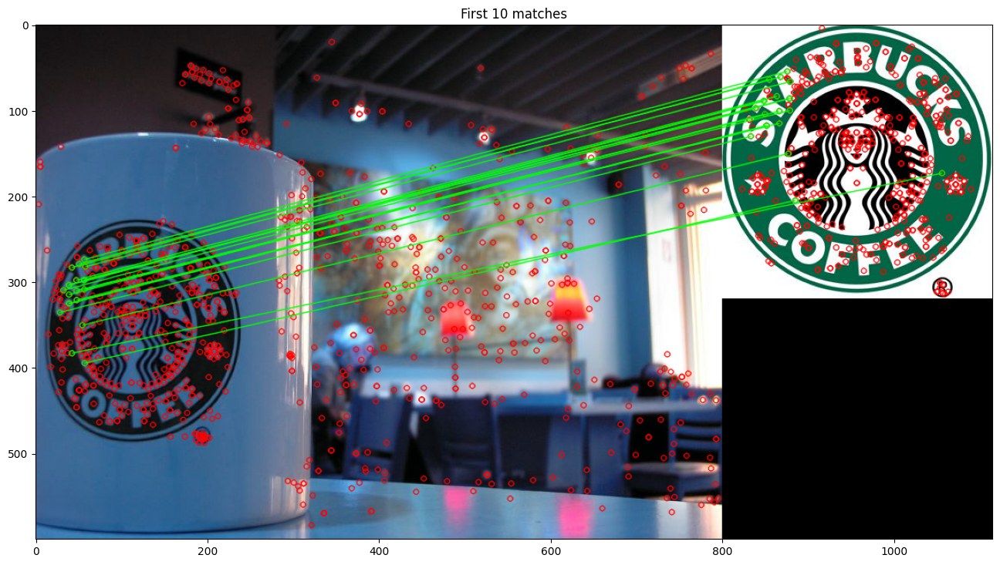

In [23]:
# Plot first 20 retieved matches
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, matched_des[:20], None, **draw_params)
plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('First 10 matches')
plt.show()

In [24]:
# Get ordered matches
ordered_matches = sorted(matched_des, key = lambda m:m.distance)

for k in range(nMatches):
  print(f"Euclidean distance: {ordered_matches[k].distance:.2f}, Query Descriptor: n. {ordered_matches[k].queryIdx}, Database Descriptor: n.{ordered_matches[k].trainIdx}")

Euclidean distance: 34.87, Query Descriptor: n. 326, Database Descriptor: n.383
Euclidean distance: 44.60, Query Descriptor: n. 421, Database Descriptor: n.495
Euclidean distance: 50.29, Query Descriptor: n. 384, Database Descriptor: n.463
Euclidean distance: 50.48, Query Descriptor: n. 256, Database Descriptor: n.310
Euclidean distance: 54.78, Query Descriptor: n. 218, Database Descriptor: n.256
Euclidean distance: 56.82, Query Descriptor: n. 435, Database Descriptor: n.507
Euclidean distance: 57.58, Query Descriptor: n. 353, Database Descriptor: n.410
Euclidean distance: 58.81, Query Descriptor: n. 309, Database Descriptor: n.363
Euclidean distance: 59.03, Query Descriptor: n. 447, Database Descriptor: n.515
Euclidean distance: 59.95, Query Descriptor: n. 184, Database Descriptor: n.212


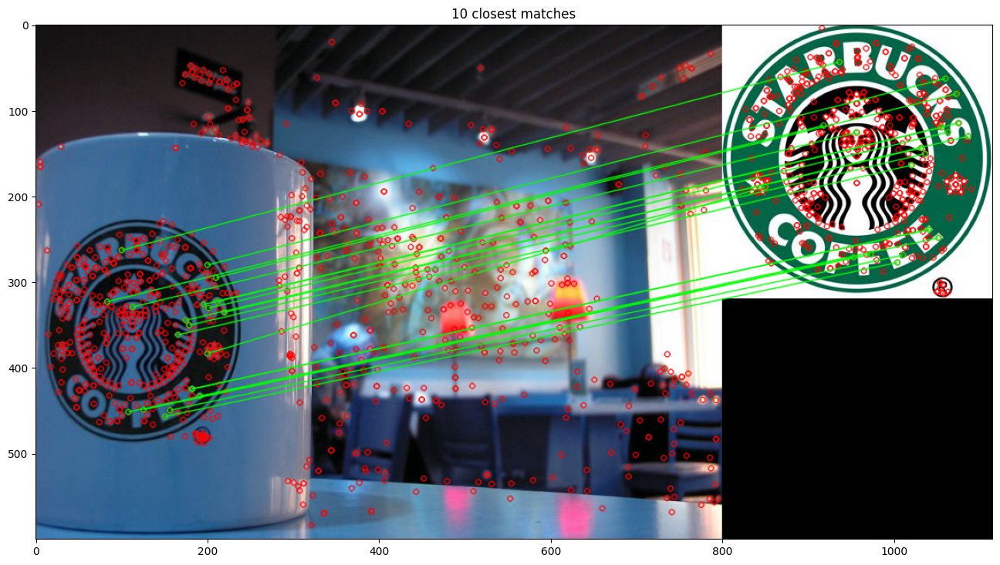

In [25]:
# Plot 20 closest mathces
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, ordered_matches[:20], None, **draw_params)
plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('10 closest matches')
plt.show()

*   **Change the constant parameter (0.70) in the ratio test. How does it affect the matching procedure?**





# **FLANN-based matcher** (Optional)

Fast Library for Approximate Nearest Neighbors (FLANN) contains a set of  optimized algorithms for fast nearest neighbor search in large datasets and it is faster than the Brute-Force matcher.

In [26]:
#################################################################################
# We need to pass two dictionaries which specifies
# the algorithm to be used and other paramters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
# Specify the number of times the trees in the index is recursively traversed
search_params = dict(checks=50)

#	<FlannBasedMatcher object>	=	cv.FlannBasedMatcher(	[, indexParams[, searchParams]]	)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Finds the k best matches for each descriptor from a query set.
matches = flann.knnMatch(query_descriptors, db_descriptors, k=2)
#################################################################################

# Apply ratio test
matched_des = []
for m_ij, m_ik in matches:
    if m_ij.distance < 0.70 * m_ik.distance:
        matched_des.append(m_ij)

In [27]:
print(f"Number of matches: {len(matched_des)}")

nMatches = 10
for k in range(nMatches):
  print(f"Euclidean distance: {matched_des[k].distance:.2f}, Query Descriptor: n. {matched_des[k].queryIdx}, Database Descriptor: n.{matched_des[k].trainIdx}")

Number of matches: 186
Euclidean distance: 182.81, Query Descriptor: n. 17, Database Descriptor: n.4
Euclidean distance: 191.49, Query Descriptor: n. 33, Database Descriptor: n.12
Euclidean distance: 146.39, Query Descriptor: n. 41, Database Descriptor: n.31
Euclidean distance: 227.60, Query Descriptor: n. 42, Database Descriptor: n.32
Euclidean distance: 199.33, Query Descriptor: n. 43, Database Descriptor: n.36
Euclidean distance: 183.65, Query Descriptor: n. 44, Database Descriptor: n.41
Euclidean distance: 175.87, Query Descriptor: n. 45, Database Descriptor: n.42
Euclidean distance: 173.50, Query Descriptor: n. 47, Database Descriptor: n.48
Euclidean distance: 203.00, Query Descriptor: n. 49, Database Descriptor: n.509
Euclidean distance: 187.89, Query Descriptor: n. 54, Database Descriptor: n.58


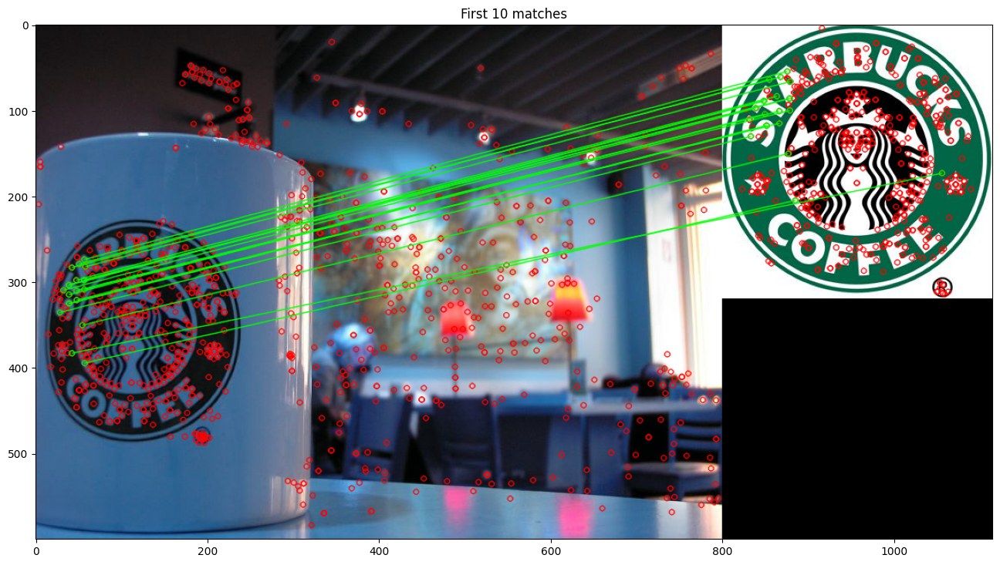

In [28]:
# Plot
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, matched_des[:20], None, **draw_params)
plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('First 10 matches')
plt.show()

# **SIFT Application - Panorama stitching**

Given two images, we will “stitch” them together to create a simple panorama. Both images need to share some common regions.

The example can also be extended to multiple images.

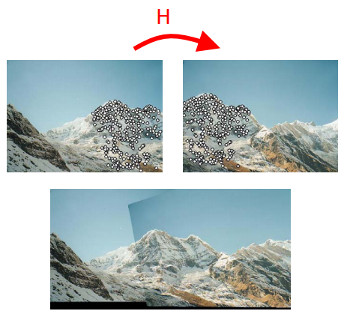

Our panorama stitching algorithm consists of four steps.

**Step 1**: Detect keypoints and extract local invariant descriptors from the two input images.

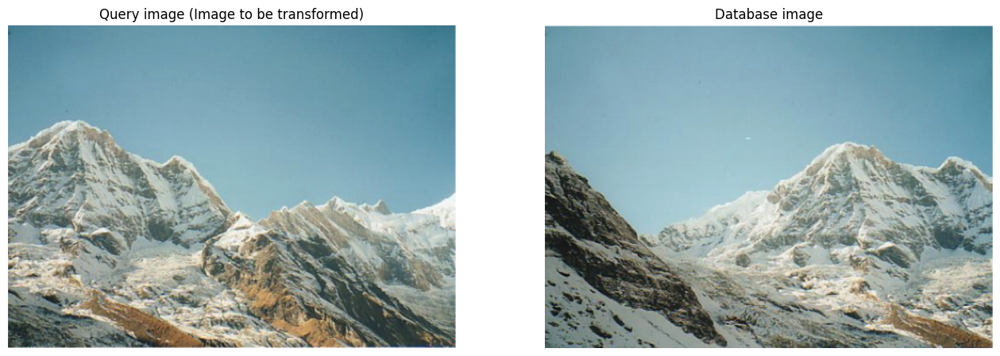

In [29]:
# Load images
database_image = cv2.imread('mountain1.png')
database_image = cv2.cvtColor(database_image, cv2.COLOR_BGR2RGB)
query_image = cv2.imread('mountain2.png')
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16,9))
plt.subplot(1,2,1), plt.imshow(query_image), plt.title("Query image (Image to be transformed)"), plt.axis("off")
plt.subplot(1,2,2), plt.imshow(database_image), plt.title("Database image"), plt.axis("off")
plt.show()

In [30]:
# Initialize SIFT object
sift = cv2.SIFT_create()

# Get keypoints and descriptors
# SIFT returns a 128-dimensional feature vector for each key point
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
db_keypoints, db_descriptors = sift.detectAndCompute(database_image, None)

print(f"Number of query keypoints: {len(query_keypoints)}")
print(f"Number of database keypoints: {len(db_keypoints)}")

Number of query keypoints: 4623
Number of database keypoints: 4365


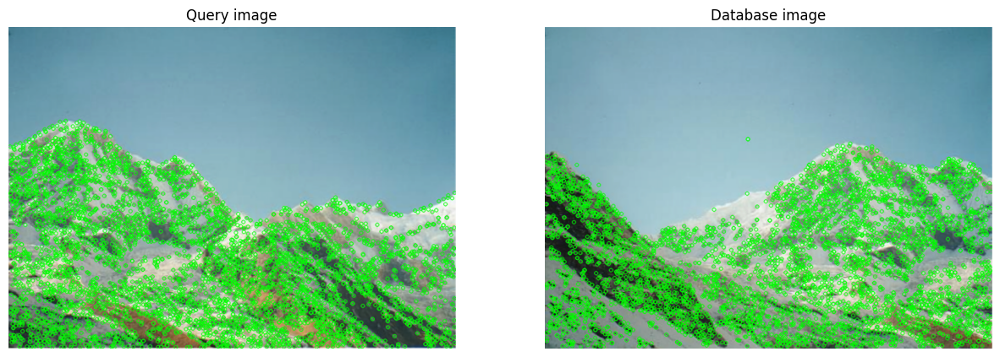

In [31]:
# display the keypoints and features detected on both images
plt.figure(figsize=(15,10))
plt.subplot(1,2,1), plt.imshow(cv2.drawKeypoints(query_image, query_keypoints, None, color=(0,255,0))), plt.title('Query image'), plt.axis("off")
plt.subplot(1,2,2), plt.imshow(cv2.drawKeypoints(database_image, db_keypoints, None, color=(0,255,0))), plt.title('Database image'), plt.axis("off")
plt.show()

**Step 2**: Match the descriptors between the two images.

In [32]:
# Brute-force matcher object
bf = cv2.BFMatcher(cv2.NORM_L2)
# Match descriptors
matches = bf.knnMatch(query_descriptors, db_descriptors, k=2)

# Apply ratio test
matched_des = []
for m_ij, m_ik in matches:
    if m_ij.distance < 0.75 * m_ik.distance:
        matched_des.append(m_ij)

print(f"Number of matches: {len(matched_des)}")

Number of matches: 872


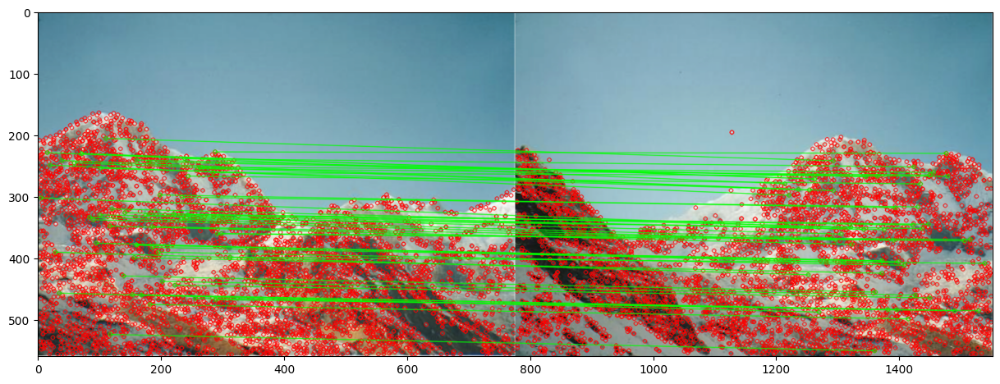

In [33]:
# Draw 50 random matches
sel_matches = np.random.randint(0, len(matched_des)-1, size=50)
matched_des_subset = [matched_des[idx] for idx in sel_matches]

fig = plt.figure(figsize=(15,10))

draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
out_matches = cv2.drawMatches(query_image, query_keypoints, database_image, db_keypoints, matched_des_subset,
                           None, **draw_params)
_ = plt.imshow(out_matches)

# **Ex. 3 - Brute-force Matcher**
Use the brute-force matcher and, rather that using the ratio test, set a threshold value (e.g., 100) and discard all the matches above that threshold.

Finally, print the number of matches, the minimum and maximum distance and plot the closest 50 matches.

In [34]:
# Brute-force matcher
bf = cv2.BFMatcher_create(cv2.NORM_L2)

# Finds the best match for each descriptor from a query set.
matches = bf.match(query_descriptors, db_descriptors)

sorted_matches = sorted(matches, key=lambda match: match.distance)

# Discard matches above the threshold
thrs = 100
thrs_matches = [sorted_matches[idx] for idx in range(len(sorted_matches)) if sorted_matches[idx].distance < thrs]

Number of Query keypoints: 4623
Number of Query descriptors: 4623
Number of database keypoints: 4365
Number of database descriptors: 4365
Number of matches: 75
Min distance: 64.74, Max distance: 99.64.


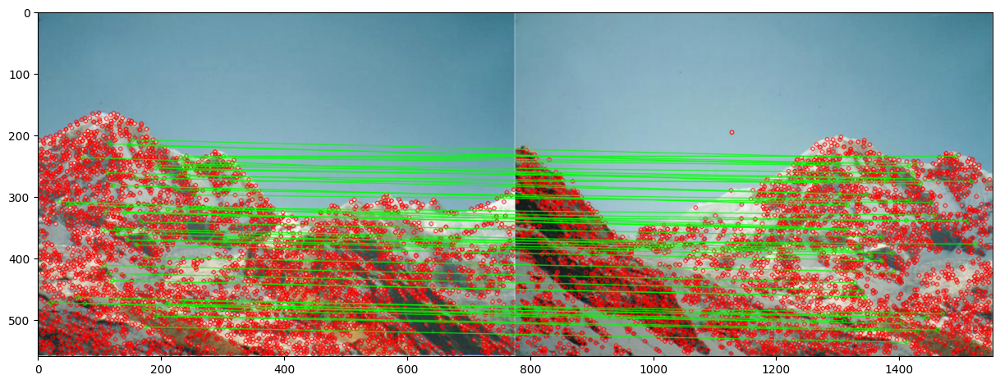

In [35]:
# Print infos
print(f"Number of Query keypoints: {len(query_keypoints)}")
print(f"Number of Query descriptors: {len(query_descriptors)}")
print(f"Number of database keypoints: {len(db_keypoints)}")
print(f"Number of database descriptors: {len(db_descriptors)}")
print(f"Number of matches: {len(thrs_matches)}")
print(f"Min distance: {thrs_matches[0].distance:.2f}, Max distance: {thrs_matches[-1].distance:.2f}.")

# plot matches
fig = plt.figure(figsize=(15,10))
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
out_matches = cv2.drawMatches(query_image, query_keypoints, database_image, db_keypoints, thrs_matches[:50], None, **draw_params)
plt.imshow(out_matches)
plt.show()

**Step 3**: Find linear transformation.

In [36]:
# Location of matches
query_pts = np.zeros((len(matched_des), 2), dtype=np.float32)
db_pts = np.zeros((len(matched_des), 2), dtype=np.float32)

for i, match in enumerate(matched_des):
  query_pts[i, :] = query_keypoints[match.queryIdx].pt
  db_pts[i, :] = db_keypoints[match.trainIdx].pt

# Find homography
H, _ = cv2.findHomography(query_pts, db_pts, cv2.RANSAC)
print(H)

[[ 5.87882137e-01  1.31295032e-01  3.87862901e+02]
 [-2.84467658e-01  8.56998658e-01  8.10903282e+01]
 [-4.92756123e-04 -7.50618669e-05  1.00000000e+00]]


**Step 4**: Apply a warping transformation using the homography matrix obtained from the previous step.

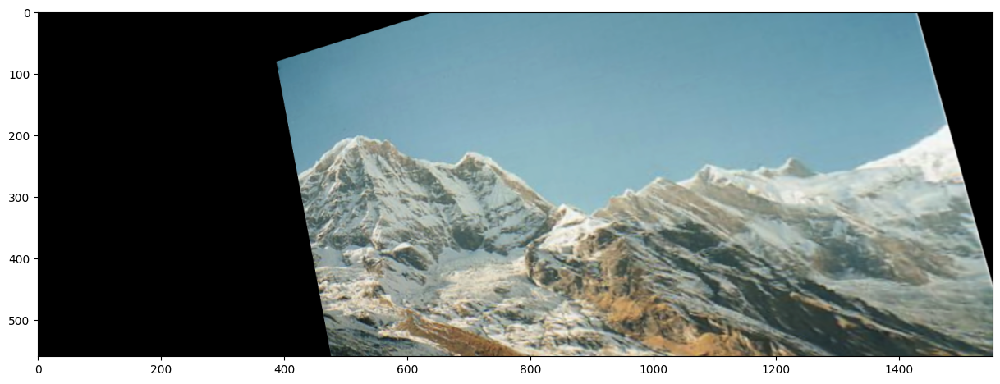

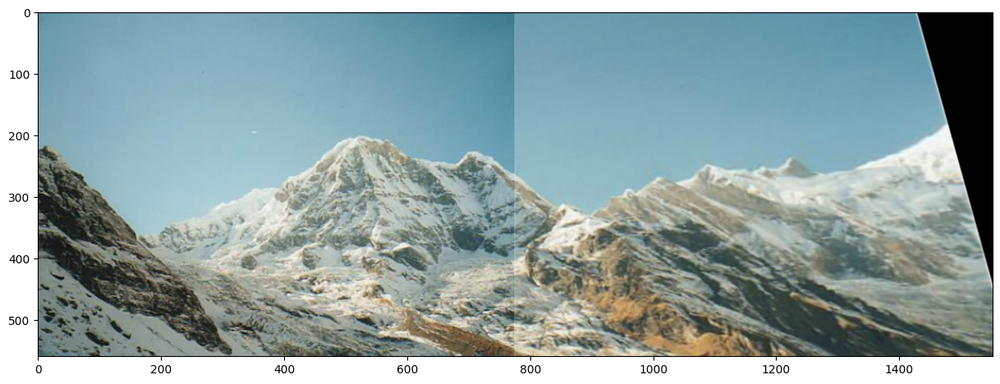

In [37]:
# Size output image
width = query_image.shape[1] + database_image.shape[1]
height = query_image.shape[0]
# Apply panorama correction
output = cv2.warpPerspective(query_image, H, (width, height))
# Display output
plt.figure(figsize=(15,10))
plt.imshow(output)
plt.show()

output[:database_image.shape[0], :database_image.shape[1], :] = database_image
# Display output
plt.figure(figsize=(15,10))
plt.imshow(output)
plt.show()

*   OpenCV provides the "Stitcher_create()" method for stitching two or more images together.

In [38]:
# Read images
img1 = cv2.imread("mountain1.png")
img2 = cv2.imread("mountain2.png")

In [39]:
# Create sticher object
stitcher = cv2.Stitcher_create()
# Apply stitching
result, img = stitcher.stitch((img1, img2))

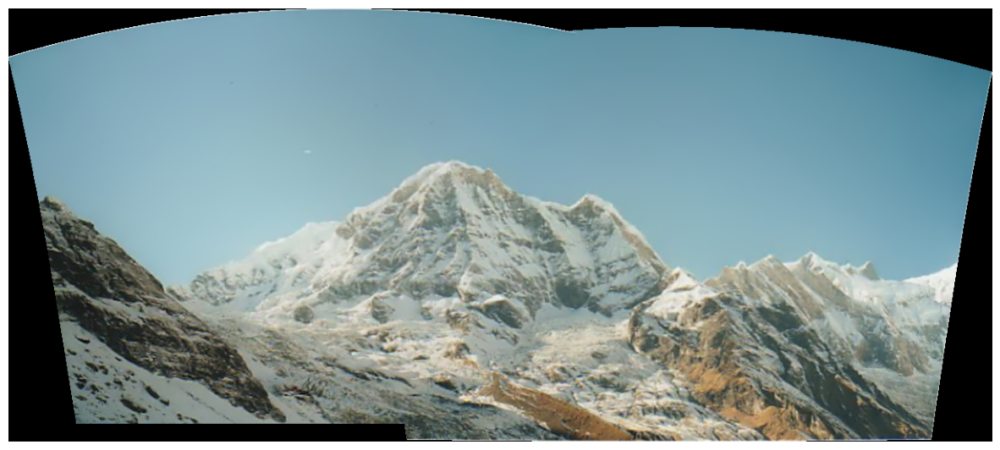

In [40]:
plt.figure(figsize=(15,8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.axis('off')
plt.show()